![eu](png\ecosea_banner.png)

# 🌎**EcoSea EO**
## *Monitoring Eutrophication Impacts from Wastewater in the Baltic Sea*

EcoSea EO is a cloud-based monitoring system that overlaps Wastewater Treatment Plant-WWTP discharges with near-real-time eutrophication indicators in the Baltic Sea. Using the Copernicus Marine Service API and Blue Cloud Vlabs data, the TRIX indicator is automatically calculated from chlorophyll, dissolved nitrogen, phosphorus, and oxygen layers.

By mapping these TRIX outputs alongside WWTP discharge points (EMODnet), the system highlights seasonal hotspots of nutrient accumulation and oxygen depletion linked to point sources. This allows authorities and operators to track the impact of WWTPs, detect leakage or illegal dumping, and identify areas where stricter nutrient limits are needed.

In practice, EcoSea EO acts as an early-warning and decision-support tool, enabling regulators to set adaptive discharge thresholds, prevent harmful algal blooms, and safeguard water quality as climate change increases eutrophication risks. By doing so, EcoSea EO not only strengthens water quality management but also contributes to conserving marine wildlife, protecting vulnerable habitats, and reducing the broader impact of human wastewater discharges on ocean health.

## *What is this notebook for?*

This Jupyter Notebook is a deliverable for the Blue Cloud Hackathon 2025. It demonstrates the application of the TRIX indicator to assess eutrophication in the Baltic Sea. The analysis highlights the impact of wastewater on the marine environment and serves as a proof of concept for the proposed solution, EcoSea EO. The tool can be further developed or adopted by the scientific community to support ongoing efforts in ocean health monitoring and conservation.

## *Resources*

This analysis uses datasets from Copernicus Marine Service and algorithms from Blue Cloud Virtual Labs - Eutrophication. Find them listed next:

- TRIX Eutrophication Indicator from [VLab Marine Environmental Indicators 🔗](https://blue-cloud.org/virtual-labs/marine-environmental-indicators)
- Baltic Sea Biogechemistry Analysis and Forecast - **N, P, O, CHL** from [Copernicus Data Store - DOI:10.48670/moi-00009 🔗](https://data.marine.copernicus.eu/product/BALTICSEA_ANALYSISFORECAST_BGC_003_007/description) [Download 🔗](https://data.marine.copernicus.eu/product/BALTICSEA_ANALYSISFORECAST_BGC_003_007/files?subdataset=cmems_mod_bal_bgc_anfc_P1M-m_202411&path=BALTICSEA_ANALYSISFORECAST_BGC_003_007%2Fcmems_mod_bal_bgc_anfc_P1M-m_202411%2F2024%2F)
- Baltic Sea Physics Analysis and Forecast - **SST, Salinity** from [Copernicus Data Store - DOI:10.48670/moi-00010 🔗](https://data.marine.copernicus.eu/product/BALTICSEA_ANALYSISFORECAST_PHY_003_006/description) [Download 🔗](https://data.marine.copernicus.eu/product/BALTICSEA_ANALYSISFORECAST_PHY_003_006/files?subdataset=cmems_mod_bal_phy_anfc_P1M-m_202311&path=BALTICSEA_ANALYSISFORECAST_PHY_003_006%2Fcmems_mod_bal_phy_anfc_P1M-m_202311%2F2024%2F)
- Urban Wastewater Treatment Discharge Locations from [EMODNET Data Catalogue 🔗](https://emodnet.ec.europa.eu/geonetwork/srv/api/records/0bd23b5e-b288-4273-b8b7-d073538ada52) 

## *Online Demo*

Find an online Demo of the TRIX Eutrophication Indicator for the Baltic Sea. To have a light version running online this demo uses only **Surface** data.

- 🌎 [EcoSea EO Online Demo 🔗](https://kepler.gl/demo/map/foursquare?path=https://data-api.foursquare.com/v1/maps/529f942e-1f65-4852-9be0-f1b06233679a) Press ▶️ and interact!
- 💻 [Code 🔗](https://github.com/gis4-wildlife/EcoSeaEO) Available also in [Blue Cloud Vlab 🔗]()

![demo-ecosea](png\demo-trix-ecosea.gif)

## *Content*

This Notebook is divided into 3 sections that make the analysis smooth, understandable, and reproducible.

1. Calculating TRIX at monthly level in the Baltic Sea
2. Automate TRIX calculation during yearly seasonality
3. Visualization of Eutrophication seasonality with WWPT

## *Data layers*

Find the ecogeographical layers for this notebook in the folder ``Data``. The directory contains different datasets and it is structured like:

- ``Data/Copernicus_biogeochem`` - Contains Phytoplankton, Nitrates, Phosphates, and Oxygen of the Baltic Sea - Monthly 2024
- ``Data/Copernicus_physics`` - Contains potential temperature (SST) and salinity of the Baltic Sea - Monthly 2024
- ``Data/Emodnet_wwtp`` - Contains urban wastewater treatment discharge location of the Baltic Sea - Updated 2025

## *How to run*

Simply, run all cells of this notebook. Be sure that you have all the data loaded in the data folders as explained above. Then, check the results as explaned below. If you want to have more monthly maps just set up the month in section 1, then run all again. The section 2 will not repeat if products were generated previously. To save time!

## *Outputs*

The outputs are generated in the folders as next:

- ``Maps``: Maps of the variables used to calculate TRIX, monthly ❗Section 1. Per month.
- ``Maps_TRIX``: Maps of TRIX Eutrophication, monthly ❗Section 1. Per month.
- ``TRIX_results``: TRIX in NetCDF for Baltic Sea all depths, monthly
- ``TRIX_surface_demo``: TRIX in NetCDF and Parquet for online demo
- ``TRIX_seasonality_BalticSea_2024.png``: 12 monthly maps with TRIX in Baltic Sea
- ``index.html``: Map animation with TRIX seasonality

### TRIX Seasonality for 2024
![trix](png\TRIX_seasonality_BalticSea_2024.png)


## *Authors*

This solution proposal was handled to *Blue Cloud Hackathon 2025* and created by the *EcoSea EO* Team lead by Bryan R. Vallejo - Geospatial Scientist from GIS4 Wildlife.

# *Analysis*

## *1. Calculating TRIX at monthly level in the Baltic Sea*

In [ ]:
# Python>=3.13

# --- for data analysis
import numpy as np                      # version: 2.3.3 
import json
import xarray as xr                    # version: 2025.9.0
import gsw                             # version: 3.6.20  Gibbs SeaWater Oceanographic Toolbox
import os, glob
import pandas as pd                     # version: 2.3.2
import geopandas as gpd                 # version: 1.1.1
from shapely.geometry import box        # version: 2.1.2  

# --- for data visualization
import matplotlib.pyplot as plt          # version: 3.10.6 
import matplotlib.colors as mcolors
import cmocean                           # version: 4.0.3 

In [2]:
# -- choose any month from 2024 like 01, 02, 03, etc
month = '03'

# -- filepaths for biogeochem and physics
filepath_bgc = rf"Data/Copernicus_biogeochem/BAL-ERGOM_BGC-MonthlyMeans-all-depths-2024{month}.nc"
filepath_phy = rf"Data/Copernicus_physics/BAL-NEMO_PHY-MonthlyMeans-2024-all-depths-{month}.nc"

In [3]:
# -- read netcdf
DS_bgc = xr.open_dataset(filepath_bgc)
DS_phy = xr.open_dataset(filepath_phy)

### *1.a Define variables of interest and units for TRIX*

To know more about the products you can review the [Copernicus Product Documentation 🔗](https://documentation.marine.copernicus.eu/PUM/CMEMS-BAL-PUM-003-006-007.pdf)

**Biogeochemistry**

- **Chlorophyll-a** as $\text{CHL}$ [ mg / $m^{-3}$] ✅
- **Diss Nitrate  in sea water** as $\text{NO}_{3}$ [ mmol / $m^{-3}$] ✅
- **Diss Phosphate in sea water** as $\text{PO}_{4}$ [ mmol / $m^{-3}$] ✅
- **Oxygen saturation** as $\text{O}_{2}$ [ % ] ✅❗

❗The Oxygen saturation is still not in the proper unit needed for TRIX. The dataset provides *Diss Oxygen Concentration* as $\text{O}_{2}$ [ mmol / $m^{-3}$]. To calculate the *Oxygen saturation* we will use physical variables.

**Physics**

- **Sea water temperature** as $\text{THETAO}$ [ $Celsius°$] ✅
- **Sea water salinity** as $\text{SO}$ [ $1e-3$] ✅

### *1.b Calculating Oxygen saturation with Physical variables*

This calculation is done by using the equation from [*Garcia and Gordon (1992)* 🔗](https://aslopubs.onlinelibrary.wiley.com/doi/10.4319/lo.1992.37.6.1307). 

Fortunately, the equation is implemented in the Python library [*Gibbs-SeaWater (GSW) - TEOS-10* 🔗](https://www.teos-10.org/software.htm) and can be applied using the entire NetCDF. Find more about the function in [*Solubity of O2 Documentation* 🔗](https://www.teos-10.org/pubs/gsw/v3_04/html/gsw_O2sol_SP_pt.html)





In [4]:
# -- extract physical variables 
S = DS_phy['so'] * 1e-3                             # Apply scaling factor to get PSU
T = DS_phy['thetao']                                # Potential temperature [°C]

# -- extract biogeochemical variables 
O2_measured = DS_bgc['o2']                          # Dissolved O2 [mmol/m^3]

# --- Oxygen solubility (µmol/kg)
O2_sol_umol_kg = gsw.O2sol_SP_pt(S, T)

# --- Convert µmol/kg → mmol/m^3
rho = gsw.rho(S, T, 0)                              # density at p=0 dbar
O2_sol_mmol_m3 = (O2_sol_umol_kg * rho) / 1000      # mmol/m^3

# --- Compute oxygen saturation (%)
O2_sat = (O2_measured / O2_sol_mmol_m3) * 100

# --- Compute Absolute Percentage Deviation (APD) from 100% saturation ⭐
APD = abs(O2_sat - 100) 

In [5]:
# --- Add to dataset biogeochemistry
DS_bgc['o2_deviation'] = APD

### *1.c Filter variables by needed ranges*

Once we have calculate calculated the needed variables for TRIX. We will proceed to filter the needed ranges.

- **Chlorophyll-a** as $\text{CHL}$ [ mg / $m^{-3}$] ✅                 
        ➡️ *Range: 0 to 4*
- **Diss Nitrate  in sea water** as $\text{NO}_{3}$ [ mmol / $m^{-3}$] ✅   
        ➡️ *Range: 0 to 30*
- **Diss Phosphate in sea water** as $\text{PO}_{4}$ [ mmol / $m^{-3}$] ✅  
        ➡️ *Range: 0 to 1*
- **Oxygen saturation** as $\text{O}_{2}$ [ % ] ✅  
        ➡️ *Range: 0 to 120*


*Note*❗
Check the ranges mentioned above in the variable visualization stored in folder ``Maps``. We will filter only negatives and zeros to avoid data gaps. Later, in TRIX visualization categories will be used to describe results. 

In [6]:
# --- filtering datasets

# CHL
DS_chl = DS_bgc['chl'].where((DS_bgc['chl'] >0))    

# NITRATES                     
DS_no3 = DS_bgc['no3'].where((DS_bgc['no3'] >0))       

# PHOSPHATES
DS_po4 = DS_bgc['po4'].where((DS_bgc['po4'] >0))   
 
# OXYGEN DEVIATION
DS_o2_dev = DS_bgc['o2_deviation'].where((DS_bgc['o2_deviation'] >0))                

### *1.d Transformation of N and P*

Transforming from $\mu\text{mol}/\text{L}$ to $\text{mg}/\text{m}^{3}$:

$$
\text{mg}/\text{m}^{3}
= \mu\text{mol}/\text{L} \times \text{AtomicWeight}_{i} \times 10^{-3}
$$

where $i = \text{N or P}$.

- Atomic weight of N = 14.00672  
- Atomic weight of P = 30.97376


In [7]:
# --- transform units for TRIX calculation

# Nitrate from mmol/m3 to umol/l
DIN = 14.00672 * DS_no3                  

# Phosphate from mmol/m3 to umol/l
TP = 30.97376 * DS_po4 

In [8]:
# --- naming variables accordingly

# chl
CHL = DS_chl

# oxygen deviation
DO_dev = DS_o2_dev

### *1.e Visualization of variables*

Let's give a quick look to the variables *DIN, TP, CHL, DO_dev* overlapping the WWTP.


In [9]:
# --- read WWTP
wwtp = pd.read_parquet(r'Data/Emodnet_wwtp/WWTP_EU_Baltic.parquet')

In [10]:
# --- DIR of visualization
home = os.getcwd()

maps = os.path.join(home, 'Maps')
maps_trix = os.path.join(home, 'Maps_TRIX')
trix_results = os.path.join(home, 'TRIX_results')
trix_surface_demo = os.path.join(home, 'TRIX_surface_demo')

# create directories if not existing
if not os.path.exists(maps):
    os.makedirs(maps)

if not os.path.exists(maps_trix):
    os.makedirs(maps_trix)

if not os.path.exists(trix_results):
    os.makedirs(trix_results)
    
if not os.path.exists(trix_surface_demo):
    os.makedirs(trix_surface_demo)   
    
# create filename
variable_bgc = os.path.join(maps, f'Variables_Biogeochem_BalticSea_2024{month}.png')
trix_output = os.path.join(trix_results, rf"TRIX-BalticSea-EcoSeaEO-alldepths-2024{month}.nc")
map_trix_month = os.path.join(maps_trix, f'TRIX_Eutrophication_BalticSea_2024{month}.png')


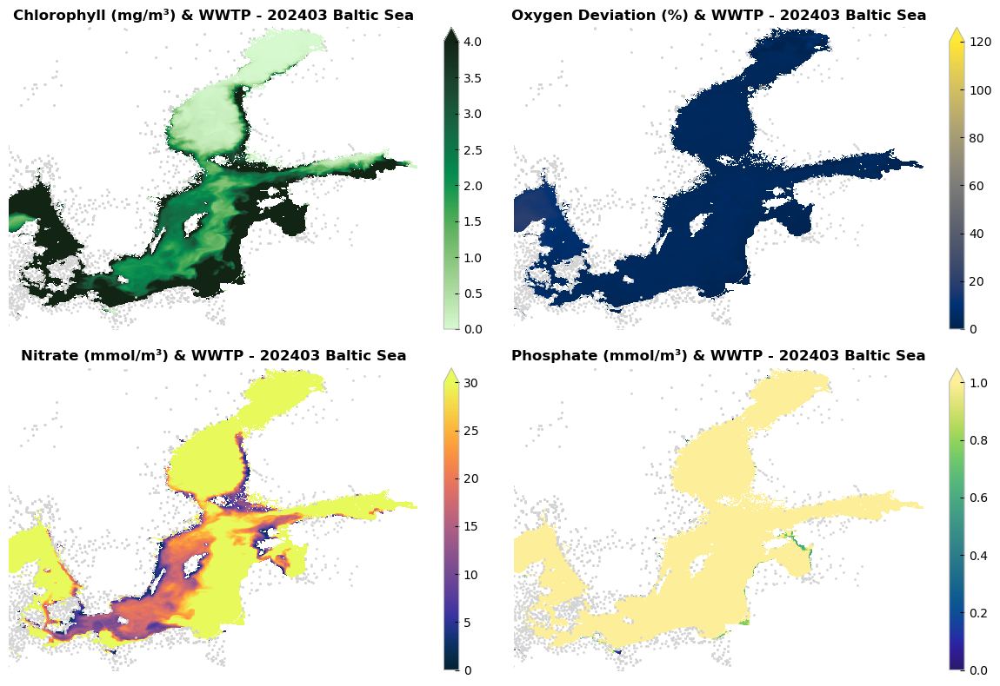

In [11]:
plt.style.use("bmh")

# --- define surface
surface = list(DS_bgc.depth.values)[0]

plots = [
    (CHL.sel(depth=surface), 0, 4, cmocean.cm.algae, f"Chlorophyll (mg/m³) & WWTP - 2024{month}"),
    (DO_dev.sel(depth=surface), 0, 120, "cividis", f"Oxygen Deviation (%) & WWTP - 2024{month}"),
    (DIN.sel(depth=surface), 0, 30, cmocean.cm.thermal, f"Nitrate (mmol/m³) & WWTP - 2024{month}"),
    (TP.sel(depth=surface), 0, 1, cmocean.cm.haline, f"Phosphate (mmol/m³) & WWTP - 2024{month}"),
]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for ax, (var, vmin, vmax, cmap, title) in zip(axes, plots):
    # plot variable
    var.plot(
        ax=ax,
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
        add_colorbar=True,
        cbar_kwargs={"label": ""},
    )
    
    # add WWTP points
    ax.scatter(
        wwtp['Longitude'], 
        wwtp['Latitude'], 
        color='lightgrey', 
        s=2,       # marker size
        edgecolor='lightgrey', 
        label='WWTP'
    )
    
    # set title with Baltic Sea and sans-serif bold
    ax.set_title(f"{title} Baltic Sea",
                 fontdict={'family': 'sans-serif', 'weight': 'bold', 'size': 12})
    
    ax.axis("off")

plt.tight_layout()

# --- save figure
plt.savefig(variable_bgc, dpi=300, bbox_inches="tight")

plt.show()


### *1.f Calculating TRIX*

The simplified formula from *Vollenweider et al. (1998)* and taken from Blue Cloud VLabs Eutrophication.

Formula is expressed as:

$$ \text{TRIX} = \frac{\log_{10}\!\left( Chl\!-\!a \times aD\%\!O \times DIN \times TP \right) + 1.5}{1.2} $$




In [12]:
# ---- Calculating TRIX

TRIX = abs(np.log10(CHL * DO_dev * DIN * TP) + 1.5) / 1.2

# --- store TRIX in netCDF file
TRIX.to_netcdf(trix_output)

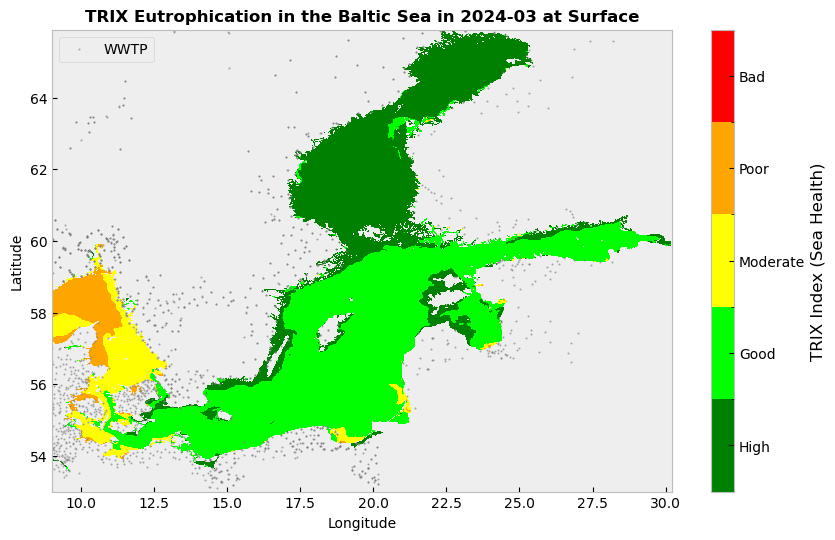

In [13]:
plt.style.use("bmh")

# --- Define TRIX categories and colors
trix_bins = [0, 4, 5, 6, 8, 10]                             # edges for categories
trix_colors = ['green', 'lime', 'yellow', 'orange', 'red']  # matching colors

# Create a colormap and norm
cmap = mcolors.ListedColormap(trix_colors)
norm = mcolors.BoundaryNorm(trix_bins, cmap.N)

# --- Plot TRIX at surface
surface = list(DS_bgc.depth.values)[0]

fig, ax = plt.subplots(figsize=(10, 6))

# Plot TRIX
im = TRIX.sel(depth=surface).plot(
    ax=ax,
    cmap=cmap,
    norm=norm,
    add_colorbar=False,
)

# --- Overlay WWTP points
ax.scatter(
                wwtp['Longitude'],
                wwtp['Latitude'],
                color='grey',  # marker color
                s=1,               # marker size
                edgecolor='grey',  # optional: outline
                alpha=0.5,
                label='WWTP'
            )
ax.legend(loc='upper left', fontsize=10)

# --- Add custom colorbar
cbar = plt.colorbar(
                    mappable=im,
                    boundaries=trix_bins,
                    ticks=[2, 4.5, 5.5, 7, 9],
                    orientation='vertical'
                )

cbar.set_ticklabels(['High', 'Good', 'Moderate', 'Poor', 'Bad'])
cbar.set_label('TRIX Index (Sea Health)')

# --- Title and labels
ax.set_title(
    f"TRIX Eutrophication in the Baltic Sea in 2024-{month} at Surface",
    fontdict={'family': 'sans-serif', 'weight': 'bold', 'size': 12}
)

ax.set_xlabel("Longitude", fontsize=10)
ax.set_ylabel("Latitude", fontsize=10)

# --- Save figure
plt.savefig(map_trix_month, dpi=300, bbox_inches="tight")
plt.show()


### *TRIX evaluation*

| TRIX Value | Ecological Status | Sea Health Interpretation                                                                   |
| ---------- | ----------------- | ------------------------------------------------------------------------------------------- |
| 0 – 4      | High              | Oligotrophic → very good water quality, low nutrient enrichment                             |
| 4 – 5      | Good              | Low nutrient impact, slightly productive                                                    |
| 5 – 6      | Moderate          | Moderate eutrophication, some algal growth                                                  |
| 6 – 8      | Poor              | Eutrophic, noticeable algal blooms, reduced oxygen in bottom waters                         |
| 8 – 10     | Bad               | Hypereutrophic → strong algal blooms, frequent oxygen depletion, poor ecological conditions |


## *2. Automate TRIX calculation for all months*

We will pack the steps before as functions. Then, to apply them for calculating TRIX for every month of 2024.

The TRIX calculated for every month are stored in the folder ``TRIX_results``



In [14]:

def load_cms(month):
    '''
    Function to read Copernicus Marine Service data for biogeochemical and physical parameters
    Parameters:
        - month (str): Month in 'MM' format (e.g., '01' for January)
    
    '''
    
    # -- choose any month from 2024 like 01, 02, 03, etc
    month_str = month

    # -- filepaths for biogeochem and physics
    filepath_bgc = rf"Data/Copernicus_biogeochem/BAL-ERGOM_BGC-MonthlyMeans-all-depths-2024{month_str}.nc"
    filepath_phy = rf"Data/Copernicus_physics/BAL-NEMO_PHY-MonthlyMeans-2024-all-depths-{month_str}.nc"
    
    # -- read netcdf
    DS_bgc = xr.open_dataset(filepath_bgc)
    DS_phy = xr.open_dataset(filepath_phy)
    
    return DS_phy, DS_bgc 


def add_o2_apd(DS_phy, DS_bgc):
    '''
    Function to calculate Absolute Percentage Deviation (APD) of Dissolved Oxygen from 100% saturation
    Parameters:
        - DS_phy (xarray.Dataset): Dataset containing physical parameters
        - DS_bgc (xarray.Dataset): Dataset containing biogeochemical parameters
    
    Returns:
        - DS_bgc (xarray.DataArray): Biogeochemistry with Absolute Percentage Deviation of Dissolved Oxygen
    '''
    
    # -- extract physical variables 
    S = DS_phy['so'] * 1e-3                             # Apply scaling factor to get PSU
    T = DS_phy['thetao']                                # Potential temperature [°C]

    # -- extract biogeochemical variables 
    O2_measured = DS_bgc['o2']                          # Dissolved O2 [mmol/m^3]

    # --- Oxygen solubility (µmol/kg)
    O2_sol_umol_kg = gsw.O2sol_SP_pt(S, T)

    # --- Convert µmol/kg → mmol/m^3
    rho = gsw.rho(S, T, 0)                              # density at p=0 dbar
    O2_sol_mmol_m3 = (O2_sol_umol_kg * rho) / 1000      # mmol/m^3

    # --- Compute oxygen saturation (%)
    O2_sat = (O2_measured / O2_sol_mmol_m3) * 100

    # --- Compute Absolute Percentage Deviation (APD) from 100% saturation ⭐
    APD = abs(O2_sat - 100) 
    
    # --- Add to dataset biogeochemistry
    DS_bgc['o2_deviation'] = APD
    
    return DS_bgc


def prepare_var_for_trix(DS_bgc):
    '''
    Function to filter and prepare variables for TRIX calculation
    Parameters:
        - DS_bgc (xarray.Dataset): Dataset containing biogeochemical parameters
    Returns:
        - CHL (xarray.DataArray): Filtered Chlorophyll data
        - DO_dev (xarray.DataArray): Filtered Dissolved Oxygen Deviation data
        - DIN (xarray.DataArray): Filtered Dissolved Inorganic Nitrogen data
        - TP (xarray.DataArray): Filtered Total Phosphorus data
    '''
    # --- filtering datasets
    
    # CHL
    DS_chl = DS_bgc['chl'].where((DS_bgc['chl'] >0))
    # NITRATES
    DS_no3 = DS_bgc['no3'].where((DS_bgc['no3'] >0))
    # PHOSPHATES   
    DS_po4 = DS_bgc['po4'].where((DS_bgc['po4'] >0))
    # OXYGEN DEVIATION
    DS_o2_dev = DS_bgc['o2_deviation'].where((DS_bgc['o2_deviation'] >0))
    
    # --- transform units for TRIX calculation
    
    # Nitrate from mmol/m3 to umol/l    
    DIN = 14.00672 * DS_no3
    
    # Phosphate from mmol/m3 to umol/l  
    TP = 30.97376 * DS_po4
    
    # --- naming variables accordingly
    
    # chl   
    CHL = DS_chl
    
    # oxygen deviation
    DO_dev = DS_o2_dev
    
    return CHL, DIN, TP, DO_dev

def calculate_trix(CHL, DIN, TP, DO_dev):
    '''
    Function to calculate TRIX index.
    Parameters:
        - CHL (xarray.DataArray): Chlorophyll data
        - DIN (xarray.DataArray): Dissolved Inorganic Nitrogen data
        - TP (xarray.DataArray): Total Phosphorus data
        - DO_dev (xarray.DataArray): Dissolved Oxygen Deviation data
    Returns:
        - TRIX (xarray.DataArray): Calculated TRIX index
    Note! Output inclues all 56 depth levels
    '''
    
    # --- Calculating TRIX with equation from Vollenweider et al. 1998
    TRIX = abs(np.log10(CHL * DO_dev * DIN * TP) + 1.5) / 1.2
    
    return TRIX

def save_trix_netcdf(TRIX, month):
    '''
    Function to save TRIX data to a netCDF file.
    Parameters:
        - TRIX (xarray.DataArray): TRIX index data
        - month (str): Month in 'MM' format (e.g., '01' for January)
    '''
    # --- DIR of visualization
    home = os.getcwd()
    trix_result = os.path.join(home, 'TRIX_results')

    if not os.path.exists(trix_result):
        os.makedirs(trix_result)
    
    # name
    filename = rf"TRIX-BalticSea-EcoSeaEO-alldepths-2024{month}.nc"
    
    # create filename
    trix_output = os.path.join(trix_result, filename)
    
    # --- store TRIX in netCDF file
    TRIX.to_netcdf(trix_output)
    
    print('TRIX saved as:', 'TRIX_results/'+ filename)
    
def create_trix_maps_folder():
    '''
    Function to create directory for TRIX maps if it doesn't exist.
    '''
    home = os.getcwd()
    trix_vis = os.path.join(home, 'Maps_TRIX')

    if not os.path.exists(trix_vis):
        os.makedirs(trix_vis)
        
    return trix_vis
    

### *2a. Run for all months of 2024*

In [15]:

# --- Loop in every month of the year 2024
for month in [f"{i:02d}" for i in range(1, 13)]:
    
    # -- If file does not exists then process TRIX
    output_trix = os.path.join(trix_results, rf"TRIX-BalticSea-EcoSeaEO-alldepths-2024{month}.nc")

    if not os.path.exists(output_trix):

        print(f"Processing month: {month}")
        
        # --- 2. Load CMS data for a specific month
        DS_phy, DS_bgc = load_cms(month)
        
        # --- 3. Add Absolute Percentage Deviation of Dissolved Oxygen to biogeochemistry
        DS_bgc = add_o2_apd(DS_phy, DS_bgc)
        
        # --- 4. Prepare variables for TRIX calculation
        CHL, DIN, TP, DO_dev = prepare_var_for_trix(DS_bgc)
        
        # --- 5. Calculate TRIX
        TRIX = calculate_trix(CHL, DIN, TP, DO_dev)
        
        # --- 6. Save TRIX to netCDF file
        save_trix_netcdf(TRIX, month)
        
        print(f"TRIX calculation and saving completed for month: {month}\n")
        
    else:
        print(f"TRIX for month {month} already exists. Skipping processing.\n")
    

Processing month: 01
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202401.nc
TRIX calculation and saving completed for month: 01

Processing month: 02
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202402.nc
TRIX calculation and saving completed for month: 02

TRIX for month 03 already exists. Skipping processing.

Processing month: 04
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202404.nc
TRIX calculation and saving completed for month: 04

Processing month: 05
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202405.nc
TRIX calculation and saving completed for month: 05

Processing month: 06
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202406.nc
TRIX calculation and saving completed for month: 06

Processing month: 07
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoSeaEO-alldepths-202407.nc
TRIX calculation and saving completed for month: 07

Processing month: 08
TRIX saved as: TRIX_results/TRIX-BalticSea-EcoS

## *3. Run yearly seasonality visualization*

For the online demo and seasonality visualization the TRIX is visualized only for the Surface of the Baltic Sea

### *3.a Create a TRIX file only for surface and all months*

In [16]:
# list of files
trix_files = sorted(glob.glob(os.path.join(trix_results, 'TRIX-BalticSea-EcoSeaEO-alldepths-2024*.nc')))

In [17]:
# --- gather files only for surface

# get surface
surface = list(xr.open_dataset(trix_files[0]).depth.values)[0]

# gather surface for all months
trix_surface_months = [xr.open_dataset(f).sel(depth=surface) for f in trix_files]

# --- concatenate along time dimension
TRIX_surface = xr.concat(trix_surface_months, dim="time")

# ---- rename variable
TRIX_surface = TRIX_surface.rename({"__xarray_dataarray_variable__": "TRIX"})

# --- save smaller, lighter dataset
TRIX_surface.to_netcdf(os.path.join(trix_surface_demo, "TRIX_surface_BalticSea_2024.nc"))

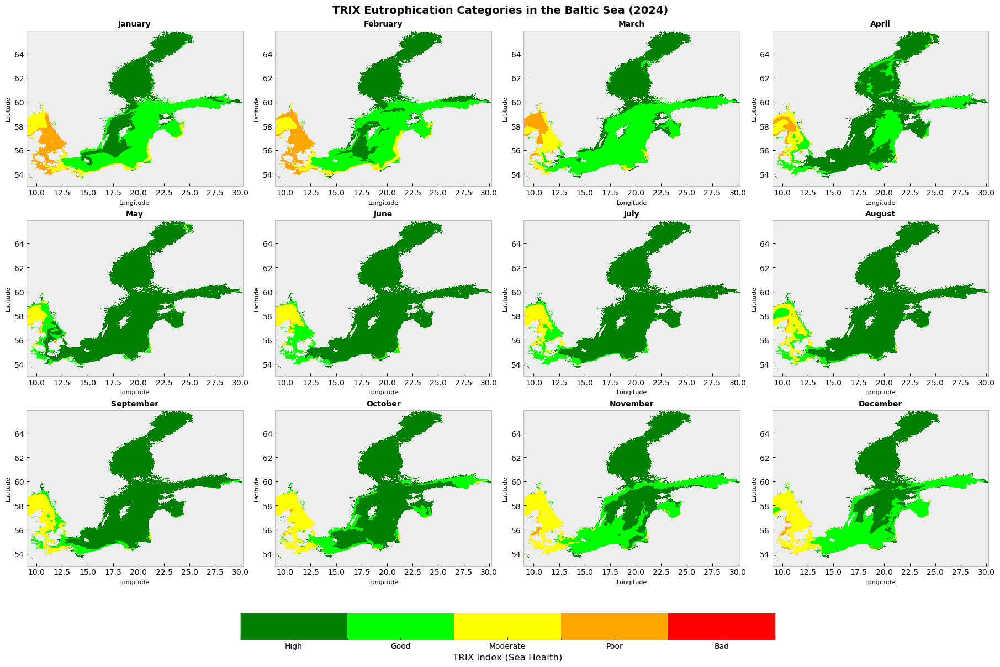

In [18]:
plt.style.use("bmh")

# --- Define TRIX categories and colors
trix_bins = [0, 4, 5, 6, 8, 10]
trix_colors = ['green', 'lime', 'yellow', 'orange', 'red']

cmap = mcolors.ListedColormap(trix_colors)
norm = mcolors.BoundaryNorm(trix_bins, cmap.N)

# --- Setup figure with 3x4 grid
fig, axes = plt.subplots(3, 4, figsize=(18, 12), constrained_layout=True)
axes = axes.flatten()

# --- Loop over months
for i, ax in enumerate(axes):
    if i < len(TRIX_surface.time):
        
        # Select DataArray for variable "TRIX" and one month
        month_data = TRIX_surface["TRIX"].sel(time=TRIX_surface.time[i])

        im = month_data.plot(
                            ax=ax,
                            cmap=cmap,
                            norm=norm,
                            add_colorbar=False
                        )

        # Add title with month name
        month_str = pd.to_datetime(str(TRIX_surface.time.values[i])).strftime("%B")
        ax.set_title(f"{month_str}", fontsize=10, weight="bold", family="sans-serif")

        ax.set_xlabel("Longitude", fontsize=8)
        ax.set_ylabel("Latitude", fontsize=8)
        
    else:
        ax.axis("off")

# --- Add shared colorbar
cbar = fig.colorbar(
                    im,
                    ax=axes,
                    boundaries=trix_bins,
                    ticks=[2, 4.5, 5.5, 7, 9],
                    orientation="horizontal",
                    fraction=0.05,
                    pad=0.05
                )

cbar.set_ticklabels(['High', 'Good', 'Moderate', 'Poor', 'Bad'])
cbar.set_label("TRIX Index (Sea Health)")


# --- Main title
fig.suptitle("TRIX Eutrophication Categories in the Baltic Sea (2024)", fontsize=14, weight="bold")

# --- Save figure
filepath_seasonality = os.path.join(home, 'TRIX_seasonality_BalticSea_2024.png')
plt.savefig(filepath_seasonality, dpi=300, bbox_inches="tight")

plt.show()


In [19]:
# Convert to DataFrame (xarray has a built-in method)
trix_df = TRIX_surface.to_dataframe().reset_index()


### *3.b Add categorization of TRIX evaluation*

Adding a column with the category will simplify the map animation

| TRIX Value | Ecological Status | Sea Health Interpretation                                                                   |
| ---------- | ----------------- | ------------------------------------------------------------------------------------------- |
| 0 – 4      | High              | Oligotrophic → very good water quality, low nutrient enrichment                             |
| 4 – 5      | Good              | Low nutrient impact, slightly productive                                                    |
| 5 – 6      | Moderate          | Moderate eutrophication, some algal growth                                                  |
| 6 – 8      | Poor              | Eutrophic, noticeable algal blooms, reduced oxygen in bottom waters                         |
| 8 – 10     | Bad               | Hypereutrophic → strong algal blooms, frequent oxygen depletion, poor ecological conditions |

In [20]:
# --- Drop NaN values
trix_df = trix_df.dropna()

# --- simplify columns
trix_seasonality = trix_df[["time", "lat", "lon", "TRIX"]]


In [21]:
trix_seasonality.head()

,time,lat,lon,TRIX
26725,2024-01-16 18:00:00,53.591621,9.597136,4.572092
26726,2024-01-16 18:00:00,53.591621,9.624913,4.471784
27487,2024-01-16 18:00:00,53.608288,9.569358,4.956350
27488,2024-01-16 18:00:00,53.608288,9.597136,4.640623
28249,2024-01-16 18:00:00,53.624954,9.541580,5.621842


In [22]:
# --- Categorize TRIX values

def classify_trix(value):
    if value < 4:
        return "High"
    elif 4 <= value < 5:
        return "Good"
    elif 5 <= value < 6:
        return "Moderate"
    elif 6 <= value < 8:
        return "Poor"
    else:
        return "Bad"

In [23]:
# ---  apply categorization
trix_seasonality["TRIX_category"] = trix_seasonality["TRIX"].apply(classify_trix)


In [24]:
# --- add timestamp as string for kepler
trix_seasonality['time'] = trix_seasonality['time'].astype(str)

### *3.c Create Grid for Baltic Sea*

We will create a geometrical grid based on the Copernicus Marine Service size which is 4km x 4km. We use a grid because the final demo works with polygon geometries. They are lights for map animation.

In [25]:
# Approximate 1 km in degrees
km_in_deg = 1 / 111  # 1 km ≈ 0.009 degrees latitude
half_side_deg = 1 * km_in_deg  # half side = 1 km → total 2 km

# Function to create square around a point
def create_square(lon, lat, half_side_deg):
    
    # Adjust longitude for latitude
    lon_offset = half_side_deg / np.cos(np.radians(lat))
    
    return box(lon - lon_offset, lat - half_side_deg, lon + lon_offset, lat + half_side_deg)

# --- Add geometry column
trix_seasonality['geometry'] = trix_seasonality.apply(lambda row: create_square(row['lon'], row['lat'], half_side_deg), axis=1)

# --- Create GeoDataFrame
trix_gdf = gpd.GeoDataFrame(trix_seasonality, geometry='geometry', crs="EPSG:4326")


In [26]:
trix_gdf.head()

,time,lat,lon,TRIX,TRIX_category,geometry
26725,2024-01-16 18:00:00,53.591621,9.597136,4.572092,Good,"POLYGON ((9.61231 53.58261, 9.61231 53.60063, ..."
26726,2024-01-16 18:00:00,53.591621,9.624913,4.471784,Good,"POLYGON ((9.64009 53.58261, 9.64009 53.60063, ..."
27487,2024-01-16 18:00:00,53.608288,9.569358,4.956350,Good,"POLYGON ((9.58454 53.59928, 9.58454 53.6173, 9..."
27488,2024-01-16 18:00:00,53.608288,9.597136,4.640623,Good,"POLYGON ((9.61232 53.59928, 9.61232 53.6173, 9..."
28249,2024-01-16 18:00:00,53.624954,9.541580,5.621842,Moderate,"POLYGON ((9.55677 53.61595, 9.55677 53.63396, ..."


In [27]:
# Dissolve squares by year_month and TRIX_category
trix_dissolved = trix_gdf.dissolve(
                            by=['time', 'TRIX_category'],
                            as_index=False
                        )

# Reset index if needed
trix_dissolved = trix_dissolved.reset_index(drop=True)

In [28]:
# save trix as geoms
diss_path = os.path.join(trix_surface_demo, "TRIX_Eutrophication_diss_BalticSea_demo.parquet")

trix_dissolved.to_parquet(diss_path)

### *3.d TRIX visualization and configuration*

We create an instance of KeplerGl and add a configuration to visualize the seasonal animation of TRIX 2024 in the Baltic Sea

In [29]:
# ---  for Demo and EcoSeaEO proposal
from pkg_resources import resource_string
from keplergl import KeplerGl  # version: 0.3.2

C:\Users\bryan\AppData\Local\Temp\ipykernel_17164\1047868574.py:2: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_string


In [30]:
# --- Load WWTP data
wwtp = pd.read_parquet(r'Data/Emodnet_wwtp/WWTP_EU_Baltic.parquet')

In [35]:
# --- load configuration
json_object = pd.read_json(r'config/config.json', typ='series').to_json()
config_scene = json.loads(json_object)

In [36]:
# Map create
Map = KeplerGl(height = 800)

# add data
Map.add_data(trix_dissolved, 'TRIX')
Map.add_data(wwtp, 'WWTP')

# add scene
Map.config = config_scene

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


In [37]:
# try saving
Map.save_to_html(file_name = f'index.html', config=config_scene)

Map saved to index.html!


In [34]:
Map

c:\Users\bryan\anaconda3\envs\ecosea\Lib\site-packages\IPython\core\formatters.py:429: FormatterWarning: text/html formatter returned invalid type <class 'bytes'> (expected <class 'str'>) for object: KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [{'dataId': ['TRIX'], 'id': '8s50lsd5g', 'name': ['time'], 'type': 'timeRange', 'value': [1705428000000, 1707068160001], 'plotType': {'type': 'histogram', 'interval': '2-day', 'aggregation': 'sum', 'defaultTimeFormat': 'L'}, 'animationWindow': 'incremental', 'yAxis': None, 'view': 'minified', 'speed': 2, 'syncTimelineMode': 1, 'enabled': True}], 'layers': [{'id': 'tba4u2', 'type': 'point', 'config': {'dataId': 'WWTP', 'columnMode': 'points', 'label': 'WWTP', 'color': [82, 151, 218], 'highlightColor': [252, 242, 26, 255], 'columns': {'lat': 'Latitude', 'lng': 'Longitude'}, 'isVisible': True, 'visConfig': {'radius': 3, 'fixedRadius': False, 'opacity': 0.8, 'outline': False, 'thickness': 2, 'strokeColor': None, 'colorRange':

KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [{'dataId': ['TRIX'], 'id': '8s50lsd5g', …